# Assignment 02 - Leonardo Harth

## Seattle's buildings energy consumption and efficiency data visualization

### CPLN 691 / MUSA 620

### Instructor: Nick Hand
### Teaching Assistant: Chloe Sheen



## Part I - Initial Data Exploration and Plots with Matplotlib

In this assignment, I aim to understand different aspects of energy consumption patterns for buildings in the city of Seattle. The data comes from the Seattle Open Data Portal. The dataset and metadata can be accessed here: https://data.seattle.gov/dataset/2017-Building-Energy-Benchmarking/qxjw-iwsh

Initial settings and data reading:

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import altair as alt
alt.renderers.enable('notebook')
%matplotlib inline
seattle_energy = pd.read_csv("2017_Building_Energy_Benchmarking.csv")
seattle_energy

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,ComplianceStatus,Outlier
0,1,2017,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,2122835.75,1.157783e+06,3.950356e+06,12884.63,1288462.99,197.63,2.235,N,Compliant,NaN
1,2,2017,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,NaN,8.841610e+05,3.016757e+06,47880.87,4788086.72,266.78,2.576,N,Compliant,NaN
2,3,2017,Campus,Hotel,84SC9-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,24313482.00,1.427692e+07,4.871284e+07,14440.00,1444000.10,1570.75,1.643,N,Compliant,NaN
3,5,2017,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,SEATTLE,WA,98101.0,0659000640,...,2228119.50,8.817449e+05,3.008514e+06,21355.88,2135587.89,244.32,3.984,N,Compliant,NaN
4,8,2017,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,NaN,1.523506e+06,5.198202e+06,91375.76,9137575.78,506.80,2.886,N,Compliant,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3456,50265,2017,Multifamily LR (1-4),NaN,NaN,1861 16TH AVE,SEATTLE,WA,NaN,8080400145,...,NaN,NaN,NaN,NaN,NaN,0.00,0.000,N,Compliant,NaN
3457,50268,2017,Multifamily MR (5-9),Mid-Rise Multifamily,Decibel Apartments,301 12th Ave,Seattle,WA,98122.0,2197600742,...,NaN,1.682466e+05,5.740574e+05,7750.23,775022.95,43.54,0.625,N,Compliant,NaN
3458,50272,2017,Multifamily MR (5-9),Mid-Rise Multifamily,Mad Flats,1523 E. Madison Street,Seattle,WA,98122.0,7234600220,...,NaN,1.472702e+05,5.024859e+05,3999.97,399997.00,23.32,1.119,N,Compliant,NaN
3459,50284,2017,Multifamily MR (5-9),Mid-Rise Multifamily,Vive,1516 NW 51st St,Seattle,WA,98107.0,2767701650,...,NaN,5.344369e+05,1.823499e+06,NaN,NaN,7.54,0.112,N,Compliant,NaN


I am interested in categorizing my visualizations based on building type, so I will first look at the distribution:

In [2]:
print(seattle_energy['BuildingType'].value_counts(dropna =False))

NonResidential          1480
Multifamily LR (1-4)    1042
Multifamily MR (5-9)     620
Multifamily HR (10+)     112
SPS-District K-12         99
Nonresidential COS        67
Campus                    39
Nonresidential WA          2
Name: BuildingType, dtype: int64


I will remap these categories to make it more concise:

In [3]:
buildingtype_map =  {'NonResidential':'NonResidential','Multifamily LR (1-4)':'Residential',
                     'Multifamily MR (5-9)':'Residential','Multifamily HR (10+)':'Residential',
                     'SPS-District K-12':'Education','Nonresidential COS':'NonResidential',
                     'Nonresidential WA':'NonResidential', 'Campus':'Education'}

seattle_energy['new_bldtp'] = seattle_energy['BuildingType'].map(buildingtype_map)

print(seattle_energy['new_bldtp'].value_counts(dropna =False))

Residential       1774
NonResidential    1549
Education          138
Name: new_bldtp, dtype: int64


I will focus this analysis on the source energy use intensity of the buildings. From the dataset metadata: "__Source Energy Use Intensity (EUI) is a property's Source Energy Use divided by its gross floor area. Source Energy Use is the annual energy used to operate the property, including losses from generation, transmission, & distribution. Source EUI is measured in thousands of British thermal units (kBtu) per square foot__". This helps to account for differences in size.

I am also interested in visualizing the percentage of electrical energy relative to total energy consumption, so I am creating this new variable:

In [4]:
seattle_energy['elec_share'] = seattle_energy['Electricity(kBtu)']/seattle_energy['SiteEnergyUse(kBtu)']
seattle_energy['elec_share'].describe()

count    3425.000000
mean        0.718213
std         0.281630
min        -0.191569
25%         0.508608
50%         0.749997
75%         1.000000
max         1.000009
Name: elec_share, dtype: float64

I would like to pose a first question to the data: are newer buildings (or newly renovated, as the data is collected) more efficient than the older ones? First, I will create a colormap according to my categories. Since there are substantially less educational buildings, I will use a higher contrast for this category.

In [5]:
bldType_colormap = {"Residential":"#ffffbf", "NonResidential" : "#2b83ba", "Education" : "#000000"}
bldType_colormap 

{'Residential': '#ffffbf', 'NonResidential': '#2b83ba', 'Education': '#000000'}

Then I will use Matplotlib to build a scatterplot of source energy use intensity vs year built. The reason for using Matplotlib is that this is a simple plot, so I can handle it well with this library's resources. First, I will summarize the data to learn how to deal with outliers.

In [6]:
seattle_energy['SourceEUI(kBtu/sf)'].describe()

count      3428.000000
mean        359.161960
std       12944.326743
min           0.000000
25%          77.700000
50%         100.200000
75%         147.125000
max      757968.500000
Name: SourceEUI(kBtu/sf), dtype: float64

Plotting Education...
Plotting NonResidential...
Plotting Residential...


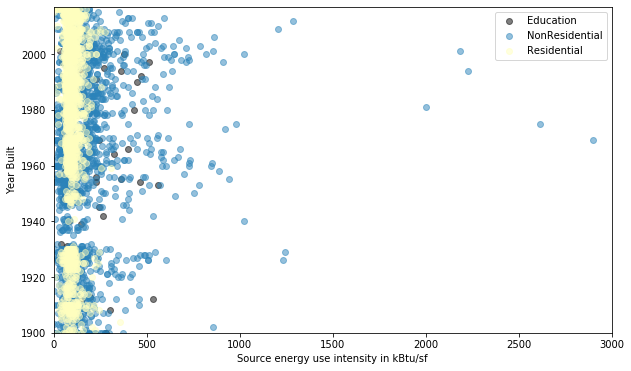

In [7]:
fig, ax = plt.subplots(figsize=(10, 6))

for bldType, group in seattle_energy.groupby("new_bldtp"):

    print(f"Plotting {bldType}...")

    ax.scatter(
        group["SourceEUI(kBtu/sf)"], # Source energy use intensity
        group["YearBuilt"], # year the building was built
        marker="o",
        label=bldType,
        color=bldType_colormap[bldType],
        alpha=0.5,
    )
    
ax.legend(loc="best")
ax.set_xlabel("Source energy use intensity in kBtu/sf")
ax.set_ylabel("Year Built")
ax.set_xlim(0, 3000) # I removed one outlier to get a better feeling of the data
ax.set_ylim(1900, 2017) 
ax.grid(False)

While residential and educational buildings seem almost unaffected by the age factor, it seems that newer nonresidential buildings are more energy-demanding.


## Part II - Seaborn Charts

Since there is a large number of variables and great variance, I will start by looking at some correlations. For that, I will take advantage of the pairplot() function of Seaborn. I will look at the year built, the total property area, the Source energy use intensity, the share of electricity from total energy consumption, and the ENERGYSTARScore (the benchmarking they use).

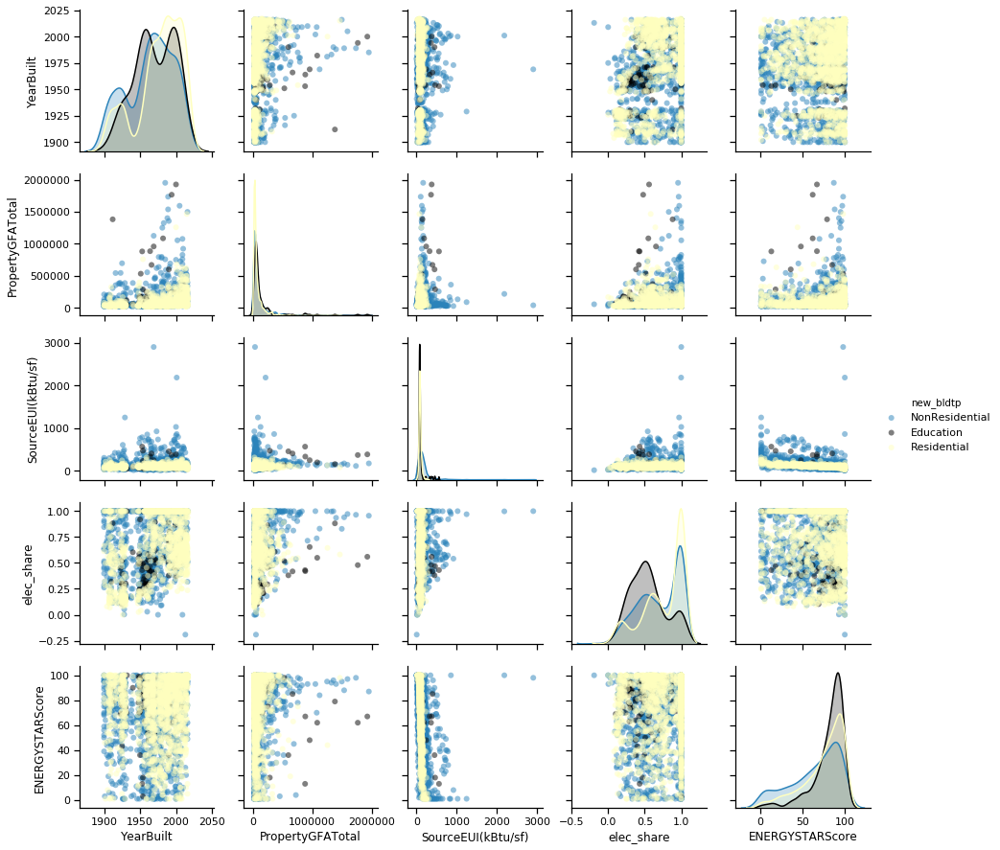

In [8]:
variables = ["new_bldtp","YearBuilt", "PropertyGFATotal", "SourceEUI(kBtu/sf)", "elec_share", "ENERGYSTARScore"]

sns.set_context("notebook", font_scale=1)

sns.pairplot(
    seattle_energy[variables].dropna(),
    palette= bldType_colormap,
    hue="new_bldtp",
    plot_kws= dict(alpha=0.5, edgecolor="none")
)

This plot gives us a huge amount of information:

1) Older buildings seem to have proportionally higher ENERGYSTARScore than the newer buildings, they use more electricity as a share of total energy consumption, they have lower source energy use intensity, and are usually smaller properties.

2) Larger buildings have on average higher ENERGYSTARScores, they use more electricity as a share of total energy consumption, and have lower source energy use intensity.

3) As expected, the source energy use intensity tends to decrease when the ENERGYSTARScore increases. The share of electricity use is higher in buildings with higher source energy use intensity.

4) The ENERGYSTARScore seems to be unaffected by the use of electricity as a share of total energy consumption.

### Note
Since  from here on I will look at averages, I will remove **one single outlier** that is more than 260 times higher than the second-highest value and disturbs my average calculations. Please note below that the count of observations comes down from 3428 to 3427.

In [9]:
seattle_energy2 = seattle_energy.loc[seattle_energy['SourceEUI(kBtu/sf)']<3000]
seattle_energy2['SourceEUI(kBtu/sf)'].describe()

count    3427.000000
mean      138.091246
std       146.599109
min         0.000000
25%        77.700000
50%       100.200000
75%       147.000000
max      2902.500000
Name: SourceEUI(kBtu/sf), dtype: float64

I want to use another Seaborn pairplot to visualize the composition of energy use in different building types, so I'll start grouping them:

In [10]:
# group by property type, get anual total use per energy type
energy_by_prop1 = seattle_energy2.groupby(['PrimaryPropertyType'])['SiteEnergyUse(kBtu)'].sum()
energy_by_prop1 = energy_by_prop1.reset_index()
energy_by_prop2 = seattle_energy2.groupby(['PrimaryPropertyType'])['Electricity(kBtu)'].sum()
energy_by_prop2 = energy_by_prop2.reset_index()
energy_by_prop3 = seattle_energy2.groupby(['PrimaryPropertyType'])['SteamUse(kBtu)'].sum()
energy_by_prop3 = energy_by_prop3.reset_index()
energy_by_prop4 = seattle_energy2.groupby(['PrimaryPropertyType'])['NaturalGas(kBtu)'].sum()
energy_by_prop4 = energy_by_prop4.reset_index()
energy_by_prop = pd.merge(energy_by_prop1, energy_by_prop2, on=['PrimaryPropertyType'], how='left')
energy_by_prop = pd.merge(energy_by_prop, energy_by_prop3, on=['PrimaryPropertyType'], how='left')
energy_by_prop = pd.merge(energy_by_prop, energy_by_prop4, on=['PrimaryPropertyType'], how='left')

energy_by_prop

,PrimaryPropertyType,SiteEnergyUse(kBtu),Electricity(kBtu),SteamUse(kBtu),NaturalGas(kBtu)
0,Distribution Center,1.343089e+08,8.666605e+07,0.000000e+00,4.764279e+07
1,High-Rise Multifamily,9.968619e+08,6.000341e+08,2.281858e+07,4.437434e+08
2,Hospital,1.334779e+09,6.274936e+08,3.040046e+08,4.032808e+08
3,Hotel,9.826730e+08,4.938383e+08,1.480981e+08,3.393568e+08
4,K-12 School,4.743986e+08,2.208653e+08,6.215911e+05,2.528803e+08
5,Laboratory,2.796257e+08,1.377637e+08,3.410039e+07,1.077615e+08
6,Large Office,3.136449e+09,2.830041e+09,9.769606e+07,2.086445e+08
7,Low-Rise Multifamily,1.396336e+09,9.923946e+08,3.752233e+06,4.008415e+08
8,Medical Office,5.139644e+08,3.703585e+08,3.907411e+07,1.045317e+08
9,Mid-Rise Multifamily,1.785794e+09,1.150158e+09,1.442010e+07,6.218171e+08


The units are too large, so i will reformat them to build a more relatable chart.

In [11]:
# Transform the data from kBtu to millions of Kbtu

energy_by_prop['SiteEnergyUse(kBtu)'] = energy_by_prop['SiteEnergyUse(kBtu)']/1000000
energy_by_prop['Electricity(kBtu)'] = energy_by_prop['Electricity(kBtu)']/1000000
energy_by_prop['SteamUse(kBtu)'] = energy_by_prop['SteamUse(kBtu)']/1000000
energy_by_prop['NaturalGas(kBtu)'] = energy_by_prop['NaturalGas(kBtu)']/1000000
energy_by_prop

,PrimaryPropertyType,SiteEnergyUse(kBtu),Electricity(kBtu),SteamUse(kBtu),NaturalGas(kBtu)
0,Distribution Center,134.308859,86.666055,0.000000,47.642794
1,High-Rise Multifamily,996.861879,600.034089,22.818577,443.743410
2,Hospital,1334.779112,627.493643,304.004628,403.280770
3,Hotel,982.672961,493.838298,148.098112,339.356820
4,K-12 School,474.398639,220.865307,0.621591,252.880350
5,Laboratory,279.625681,137.763749,34.100388,107.761528
6,Large Office,3136.449281,2830.041011,97.696057,208.644544
7,Low-Rise Multifamily,1396.335723,992.394634,3.752233,400.841512
8,Medical Office,513.964397,370.358516,39.074111,104.531729
9,Mid-Rise Multifamily,1785.794218,1150.158002,14.420096,621.817051


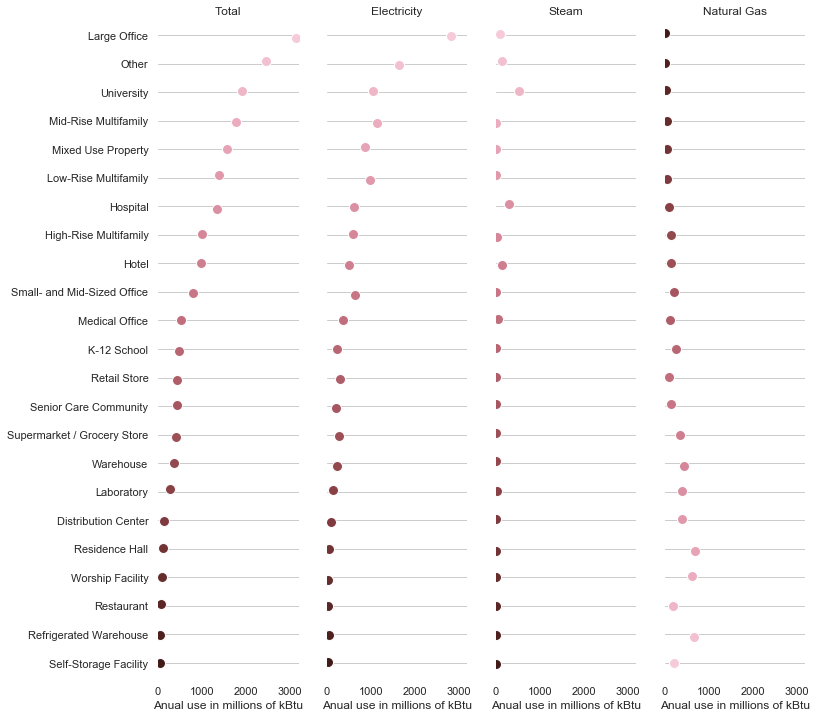

In [12]:
sns.set(style="whitegrid")

g = sns.PairGrid(energy_by_prop.sort_values("SiteEnergyUse(kBtu)", ascending=True),
                 x_vars=energy_by_prop.columns[1:5], y_vars=["PrimaryPropertyType"],
                 height=10, aspect=.25)

g.map(sns.stripplot, size=10, orient="h",
      palette="ch:s=1,r=-.1,h=1_r", linewidth=1, edgecolor="w")

g.set(xlim=(0, 3200), xlabel="Anual use in millions of kBtu", ylabel="")

titles = ["Total", "Electricity", "Steam",
          "Natural Gas"]

for ax, title in zip(g.axes.flat, titles):

    ax.set(title=title)

    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

sns.despine(left=True, bottom=True)

I chose this chart to show the total annual energy consumption in millions of kBtu per property type and per source of energy. These parallel charts offer a quick and easy visualization. Large offices consume the most energy in the city and most of it comes from electricity. It is interesting that Universities have a very high consumption as well, but a different composition: significant parts of its energy consumption rely on steam and natural gas. Mid-rise residential buildings and mix-use buildings in Seattle use substantial amounts of natural gas. But for most property types, the total consumption curve is very similar to the electricity curve.

## Part III - Altair Charts

In the first Seaborn chat above, I have explored the correlation between variables in 3 major categories: residential buildings, nonresidential buildings, and educational buildings. These categories are broad, so I want to take a look at what is happening in each property type regarding the source energy use intensity.

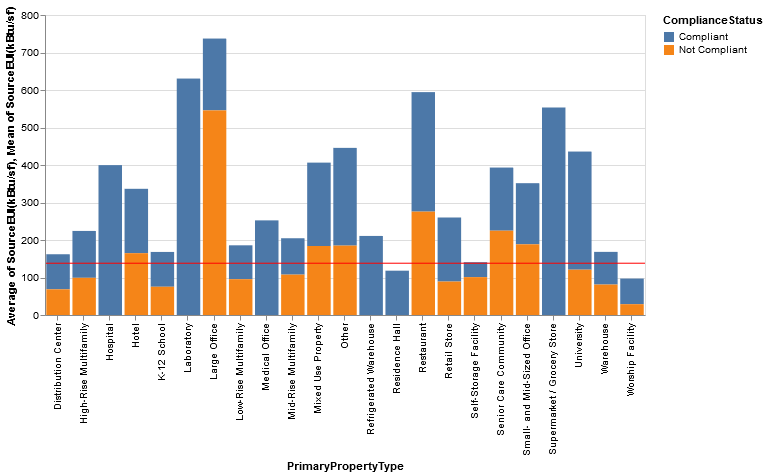

In [13]:
bar = alt.Chart(seattle_energy2).mark_bar().encode(
    x=alt.X('PrimaryPropertyType:N'),
    y=alt.Y('average(SourceEUI(kBtu/sf)):Q', scale=alt.Scale(domain=(0, 800))),
    color = 'ComplianceStatus:N',    
)

rule = alt.Chart(seattle_energy2).mark_rule(color='red').encode(
    y='mean(SourceEUI(kBtu/sf)):Q'
)

(bar + rule).properties(width=600)


This first chart reveals interesting information about many categories:

* Laboratories, Hospitals, and Supermarkets use a lot of energy per square foot, but they are normally compliant.

* Large offices also consume a lot of energy per square foot, but they are mostly noncompliant.

* Restaurants and Hotels are both above the average, and only about half of them tend to be compliant.

This chart made me wonder whether these characteristics are uniform over the years, which leads to the next chart, which adds the age factor.



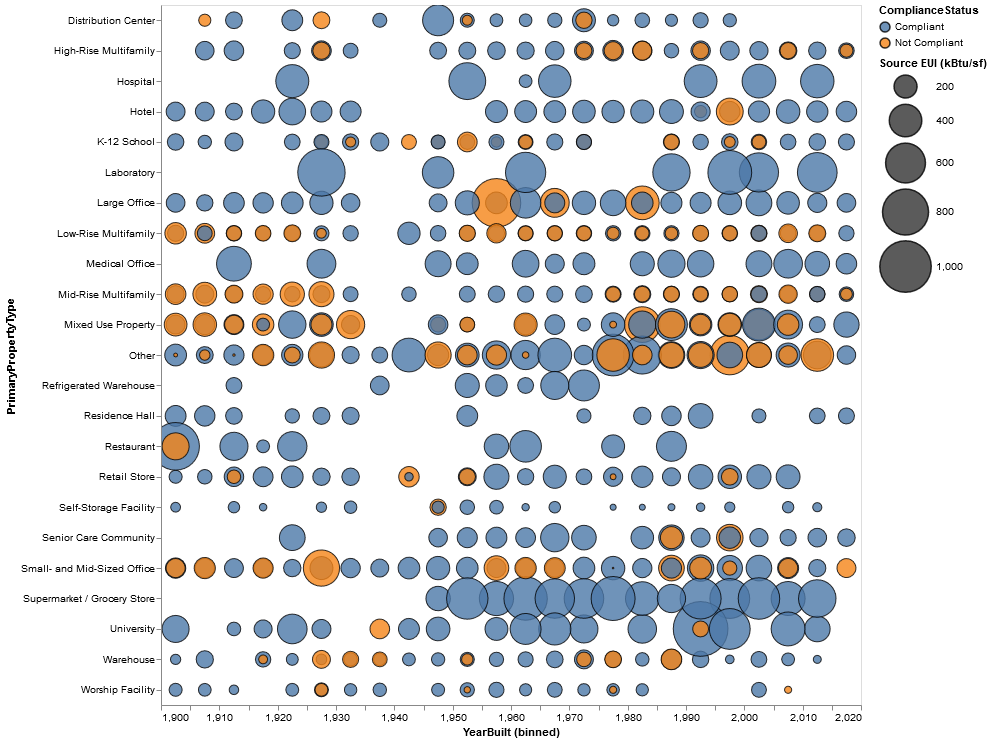

In [14]:
alt.Chart(seattle_energy2).mark_circle(
    opacity=0.8,
    stroke='black',
    strokeWidth=1
).encode(
    alt.X('YearBuilt:Q', bin=alt.Bin(maxbins=30)),
    alt.Y('PrimaryPropertyType:N'),
    alt.Size('average(SourceEUI(kBtu/sf)):Q',
        scale=alt.Scale(range=[0, 3000]),
        legend=alt.Legend(title='Source EUI (kBtu/sf)')
    ),
    alt.Color('ComplianceStatus:N')
).properties(
    width=700,
    height=700
).interactive()

The chart above classifies the average source EUI and bins it per year built. With this chart, it is easier to visualize certain distortions that were displayed in the previous chart. I made the chart interactive so that it becomes easier to see what happens at particular time intervals. The large office's category is the one that consumes the most energy in Seattle, as seen in the second Seaborn chart. The first Altair chart (bar chart) suggests that they are mostly non compliant, but the chart above shows that large offices in the late 50s, late 60s, and mid-80s are the ones with very high average Source EUI and mostly non-compliant. I got curious about the category 'other', that is mostly noncompliant regardless of year built. From the second Seaborn chart, the mid-rise multi-family category is known to have a high portion of its energy consumption based on natural gas. Curiously, mid-rise building built before 1930 and after the mid-70s are commonly noncompliant. This chart makes also very easy to see how supermarkets and labs consume a lot of energy per square foot.

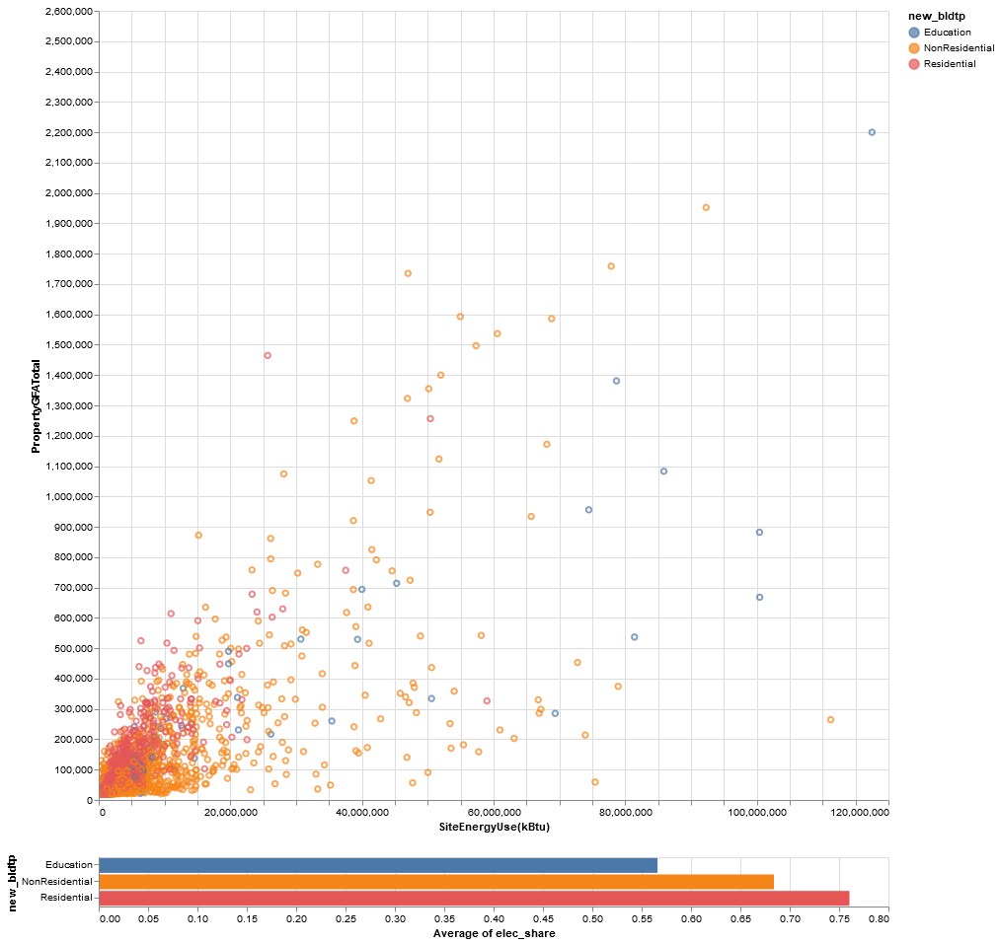

In [15]:
brush = alt.selection(type='interval')

points = alt.Chart().mark_point(clip=True).encode(
    x=alt.X('SiteEnergyUse(kBtu):Q',scale=alt.Scale(domain=(0, 120000000))),
    y=alt.Y('PropertyGFATotal:Q',scale=alt.Scale(domain=(0, 2500000))),
    color=alt.condition(brush, 'new_bldtp:N', alt.value('lightgray')),
    tooltip=['PrimaryPropertyType', 'YearBuilt']
).properties(
    selection=brush,
    width=800,
    height=800
)

bars = alt.Chart().mark_bar().encode(
    y='new_bldtp:N',
    color='new_bldtp:N',
    x='average(elec_share):Q'
).transform_filter(
    brush.ref() 
                
).properties(
width=800,
height=50
)

chart = alt.vconcat(points, bars, data=seattle_energy2)
chart

Finally, this last chart allows us to combine many of the larger-scale analysis with some detailed information. It enables the visualization of the correlation between total energy consumption and total building area per building type. To make it more granular, I added the 'tooltip' function to allow the user to see the property type and year built of each observation when you hover the cursor over it. This chart also uses the 'transform filter' and the 'brush' tool to enable the selection of a subset of the displayed data that automatically updates the bar chart below, calculating the average share of electricity. This chart shows the trend of education buildings consuming more energy per square feet than the other categories. We know from previous charts that this occurs mainly because of the high Source EUI of universities (schools have normally low Source EUI). If we select the six education observations clustered 80 and 100 million kBtus, we see that they have a slightly lower percentage of electricity use (approximately 53%), suggesting that larger buildings play a fundamental role to keep the average use of electricity lower in educational buildings. We also see that residential buildings tend to use less energy per square foot and that their overall energy consumption is low and relies heavily on electricity.